Importar librerias

In [2]:
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from quickda.explore_data import *
from quickda.clean_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
from quickda.explore_time_series import *

Analisis exploratorio

In [68]:
#Cargar dataframe y obtener primeros valores para conocimiento de datos
dataframe = pd.read_csv('train.csv', encoding='latin-1',engine='python')
print(dataframe.head())

   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL         65.0     8450   Pave   NaN      Reg   
1   2          20       RL         80.0     9600   Pave   NaN      Reg   
2   3          60       RL         68.0    11250   Pave   NaN      IR1   
3   4          70       RL         60.0     9550   Pave   NaN      IR1   
4   5          60       RL         84.0    14260   Pave   NaN      IR1   

  LandContour Utilities  ... PoolArea PoolQC Fence MiscFeature MiscVal MoSold  \
0         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
1         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      5   
2         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      9   
3         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
4         Lvl    AllPub  ...        0    NaN   NaN         NaN       0     12   

  YrSold  SaleType  SaleCondition  SalePrice  
0   2008        WD   

In [ ]:
#Correr para generar reporte (se limpio por tamaño del jupyter)
profile = ProfileReport(dataframe)
profile

In [65]:
#Obtener el tipo de cada variable para clasificacion
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [9]:
#Obtener estadisticas de los datos
explore(dataframe, method="summarize")

c:\Users\Bryann\AppData\Local\Programs\Python\Python38\lib\site-packages\quickda\explore_data.py:26: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

c:\Users\Bryann\AppData\Local\Programs\Python\Python38\lib\site-packages\quickda\explore_data.py:30: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
1stFlrSF,int64,1460,0,0.000,753,334,882.0,1087.0,1391.25,4692,1162.626712,1087.0,386.587738,1.376757
2ndFlrSF,int64,1460,0,0.000,417,0,0.0,0.0,728.0,2065,346.992466,0.0,436.528436,0.81303
3SsnPorch,int64,1460,0,0.000,20,0,0.0,0.0,0.0,508,3.409589,0.0,29.317331,10.304342
Alley,object,91,1369,0.938,2,-,-,-,-,-,-,-,-,-
BedroomAbvGr,int64,1460,0,0.000,8,0,2.0,3.0,3.0,8,2.866438,3.0,0.815778,0.21179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Utilities,object,1460,0,0.000,2,AllPub,-,-,-,NoSeWa,-,-,-,-
WoodDeckSF,int64,1460,0,0.000,274,0,0.0,0.0,168.0,857,94.244521,0.0,125.338794,1.541376
YearBuilt,int64,1460,0,0.000,112,1872,1954.0,1973.0,2000.0,2010,1971.267808,1973.0,30.202904,-0.613461
YearRemodAdd,int64,1460,0,0.000,61,1950,1967.0,1994.0,2004.0,2010,1984.865753,1994.0,20.645407,-0.503562


In [69]:
#Estandarizar nombres de variables
dataframe_standard = clean(dataframe, method = "standardize")

In [70]:
#Separar variables categoricas y numericas
cuantitativas = pd.DataFrame(dataframe_standard.select_dtypes(include=[float, int]))
categoricas = pd.DataFrame(dataframe_standard.select_dtypes(exclude=[float, int]))

Outlier Analysis - Boxplot


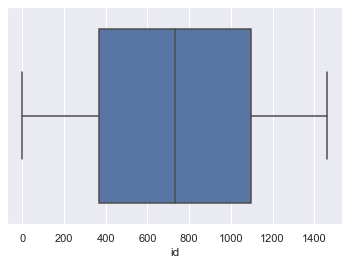

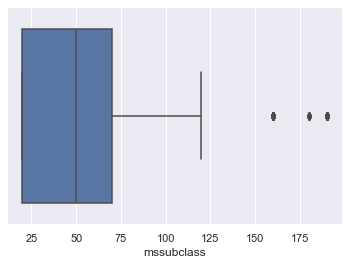

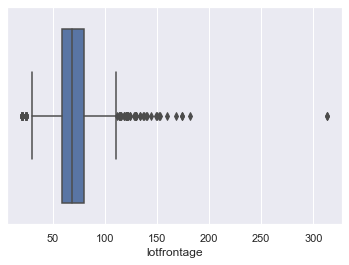

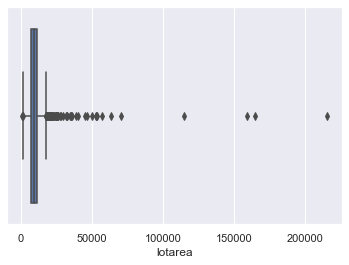

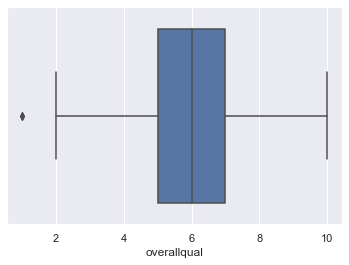

...

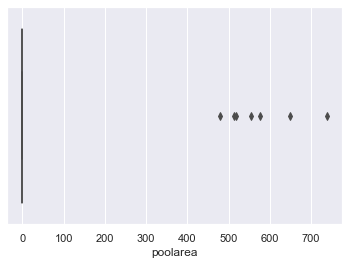

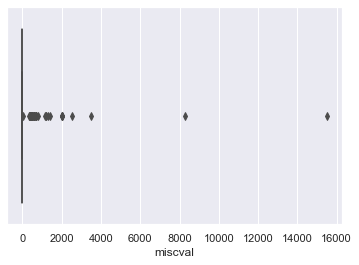

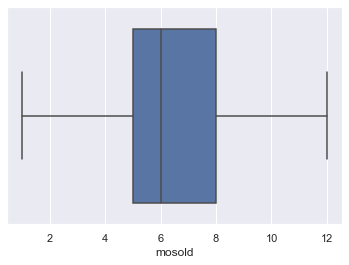

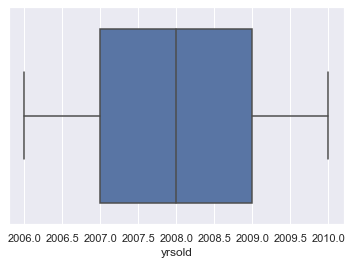

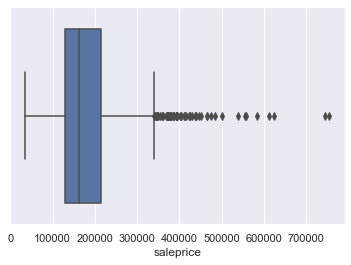

Distribution Analysis - Histogram


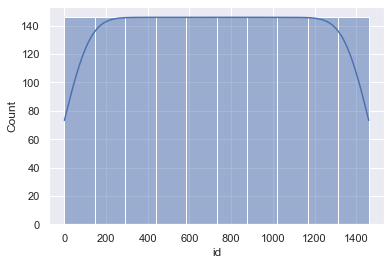

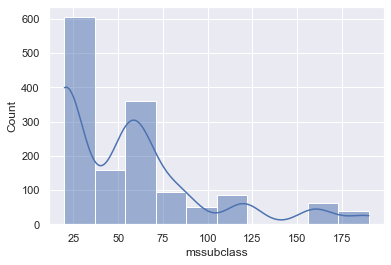

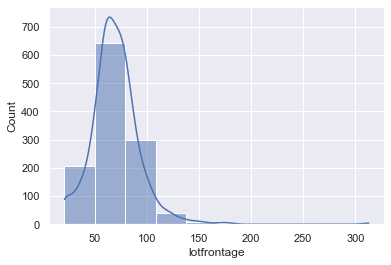

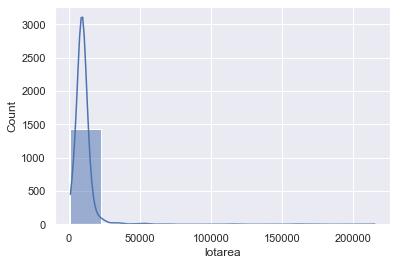

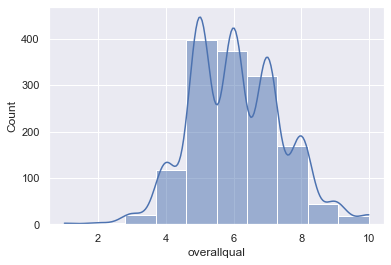

...

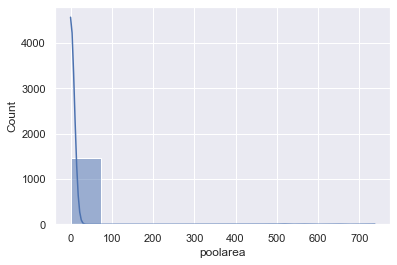

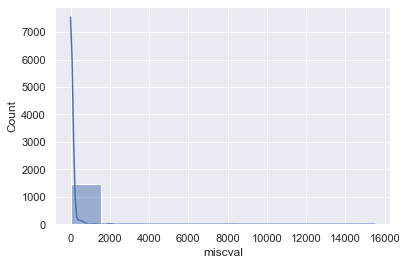

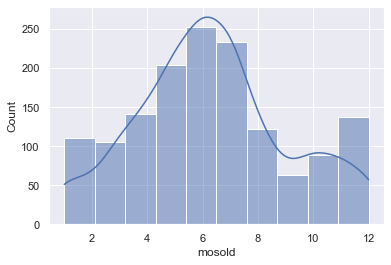

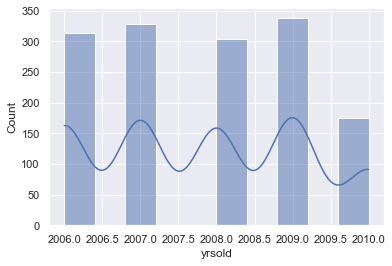

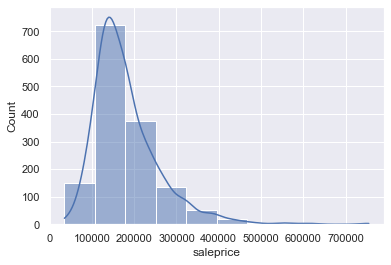

In [19]:
#Graficos, datos numericos
eda_num(cuantitativas)

Must have equal len keys and value when setting with an iterable
Bar Plot of alley


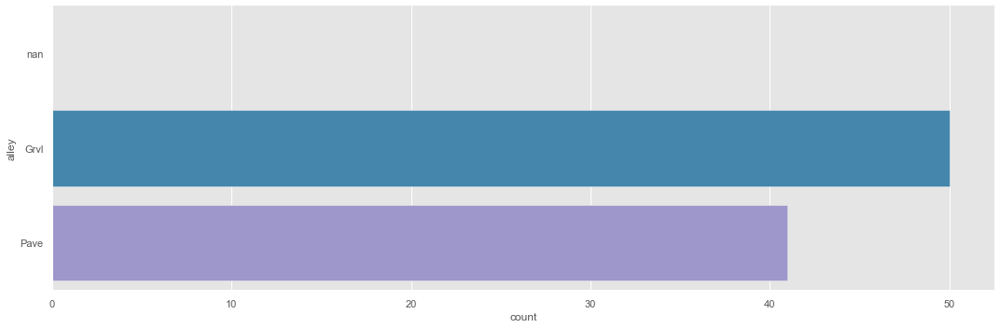

Summary of alley


,count,relative_pct
NaN,1369,0.94
Grvl,50,0.03
Pave,41,0.03


In [73]:

#Cambiar tipo a category
columns = dataframe_standard.select_dtypes(include=[object])
dataframe_standard = clean(dataframe_standard, method = 'dtypes', columns = columns.columns, dtype='category')

#Graficas datos cualitativos, alley en este caso
eda_cat(dataframe_standard, x = 'alley')

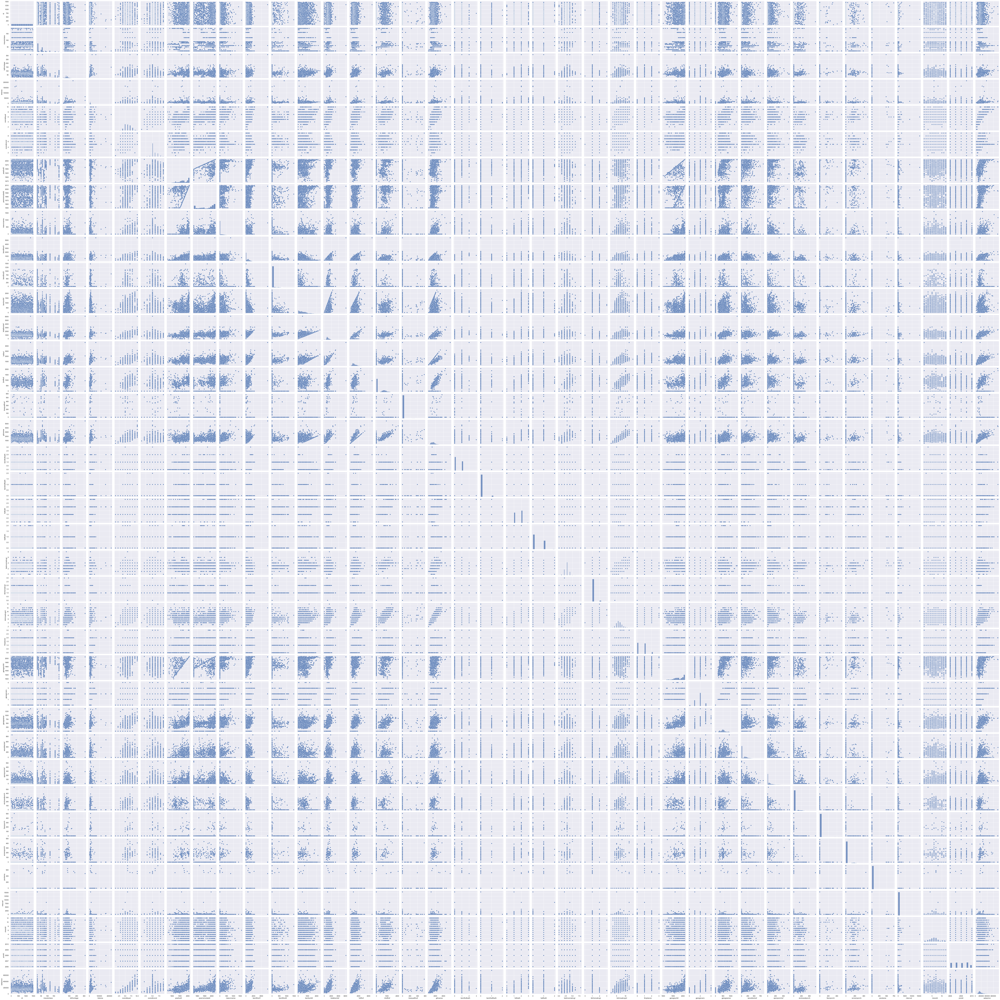

In [37]:
sns.pairplot(dataframe_standard)

In [9]:
#Profile report de cuantitativas

profile_cuanti = ProfileReport(cuantitativas)
profile_cuanti



In [ ]:

#Profile report de categoricas
profile_cuali = ProfileReport(categoricas)
profile_cuali

Analisis PCA

In [45]:
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_kmo

cuantitativas.dropna(inplace=True)
kmo_model = calculate_kmo(cuantitativas)
print("Calculo KMO")
kmo_model[1]

Calculo KMO


0.7816235923072172

In [47]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(cuantitativas)
chi_square_value, p_value
print("Calculo Bartlett")
print("Valor p-value: ", p_value)

Calculo Bartlett
Valor p-value:  0.0


In [48]:
from sklearn.preprocessing import StandardScaler


scale_object = StandardScaler()
scale_object.fit(cuantitativas)
scaled_cuanti_data = scale_object.transform(cuantitativas)


Text(0.5, 1.0, 'Scree Plot')

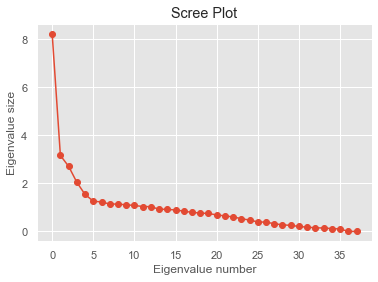

In [64]:
#Scree plot
#Obtenido de> Mausolf , J. (s.f)
#https://jmausolf.github.io/code/pca_in_python/
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(scaled_cuanti_data).transform(scaled_cuanti_data)

import matplotlib.pyplot as plt
plt.style.use("ggplot") 
plt.plot(pca.explained_variance_, marker='o')
plt.xlabel("Eigenvalue number")
plt.ylabel("Eigenvalue size")
plt.title("Scree Plot")


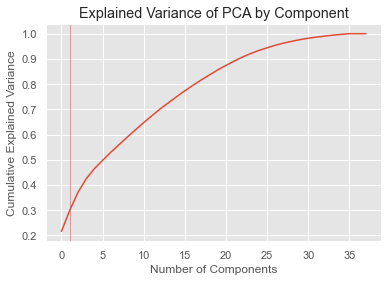

In [63]:
#Obtenido de> Mausolf , J. (s.f)
#https://jmausolf.github.io/code/pca_in_python/
import numpy as np
from matplotlib.pyplot import figure, show
from matplotlib.ticker import MaxNLocator

ax = figure().gca()
ax.plot(np.cumsum(pca.explained_variance_ratio_))
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.axvline(x=1, linewidth=1, color='r', alpha=0.5)
plt.title('Explained Variance of PCA by Component')
plt.show()